# Import librairies

In [11]:
!pip3 install ipympl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.3/510.3 kB 981.2 kB/s eta 0:00:00a 0:00:01


In [1]:
# Librairies for basics manipulation on file
import os
import sys
import inspect
from os import listdir
from os.path import isfile, join
import six

#Math and array and data manipulation librairies
import math
import numpy as np
import pandas as pd
from random import sample
import random

# Images librairies
import cv2
from easyimages import EasyImageList

# Plots librairies
from matplotlib import pyplot as plt
#plt.rcParams["figure.figsize"] = (10,10)
import seaborn as sns
import plotly.graph_objects as go
from scipy.interpolate import griddata
import plotly.offline as pyo
import plotly.io as pio

# Add missing modules
sys.modules['sklearn.externals.six'] = six
# ML Librairies
import mlrose
%matplotlib widget

/usr/local/lib/python3.8/dist-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.13) or chardet (5.1.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


# Analysis of images

__The aim of this part is to have a small anaylis on the 512*512 PNG images before using them__

## Import of images

TODO:
Explain what is the dataset about, how it was exported from DICOM to PNG (what is DICOM and PNG)

In [2]:
# Path to the dataset of png images, (to change)
path = "../kaggle_dataset"

In [3]:
# Take the n first files names of the dataset of images
n_files = 30
onlyfiles = [f for f in listdir(path)[:n_files] if isfile(join(path, f))]

In [4]:
# Load the list of images
imgs = []
for file in onlyfiles:
    img = cv2.imread(f"{path}/{file}")
    imgs.append(img)
# Print the Shape of image as it is a Numpy Array
print("Image Shape:", img.shape)

Image Shape: (512, 512, 3)


## Quick preview of images

In [5]:
Li = EasyImageList.from_folder(path)
Li.html(sample=800, size=30)

__Here we can see that it seems that the data don't have missing or incoherent images (the sample is not necessary representative from the dataset since we only take 800 images from more than 50k). It appears that images have very different shapes, contrast, luminosity. It is also worth mentioning that black pixels represent on many screenings an important part of the image.There are also some anotations about the view of the image on the image__

## Display some images with histograms

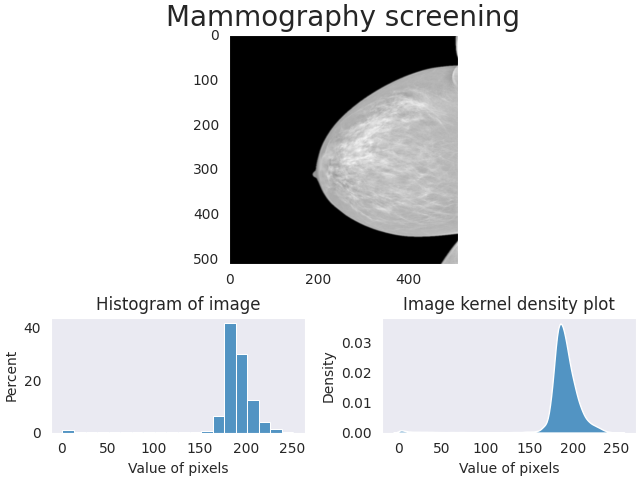

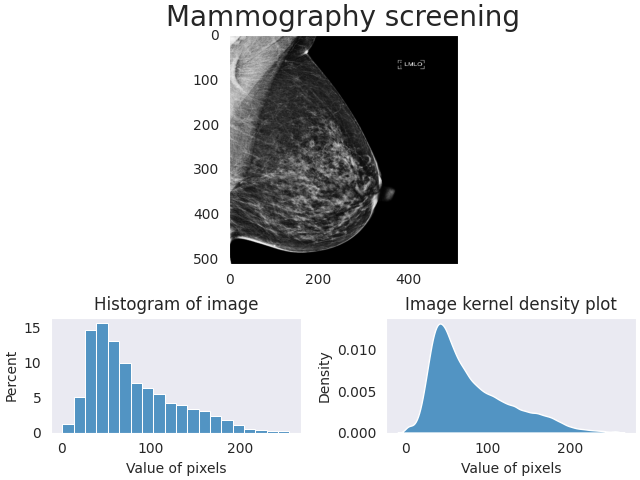

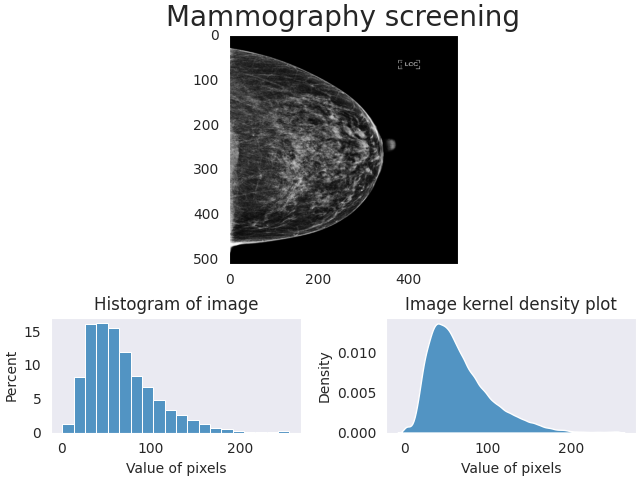

In [6]:
# Display n images with associated histogramms and kde plots
n_images = 3
seed = 53
random.seed(seed)
imgs_sample = sample(imgs,n_images)

for img in imgs_sample:
    sns.set_style("dark")
    fig5 = plt.figure(constrained_layout=True)
    widths = [20, 20]
    heights = [20, 10]
    spec5 = fig5.add_gridspec(ncols=2, nrows=2, width_ratios=widths,
                              height_ratios=heights)

    ax = fig5.add_subplot(spec5[0, :])
    ax.set_title("Mammography screening")
    ax.title.set_size(20)
    plt.imshow(img)


    ax = fig5.add_subplot(spec5[1, 0])
    sns.histplot(img[np.where(img!=0)].flatten(), bins=20, stat = "percent")
    ax.set_xlabel("Value of pixels")
    ax.set_title("Histogram of image")

    ax = fig5.add_subplot(spec5[1, 1])
    sns.kdeplot(data=img[np.where(img!=0)].flatten(), multiple="stack")
    ax.set_title("Image kernel density plot")
    ax.set_xlabel("Value of pixels")
    plt.show()   

__We could see that images seem to have a large part of pixels that has the value 0 (we remove them from histograms to ease the read) and they seem to have different histograms shape (different range of pixels values, different repartitions and different contrasts...)__

## Normalized images

In [7]:
imgs_equzd_sample = [cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)) for img in imgs_sample]
#img_eqz = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#img_equz = cv2.equalizeHist(img_eqz)

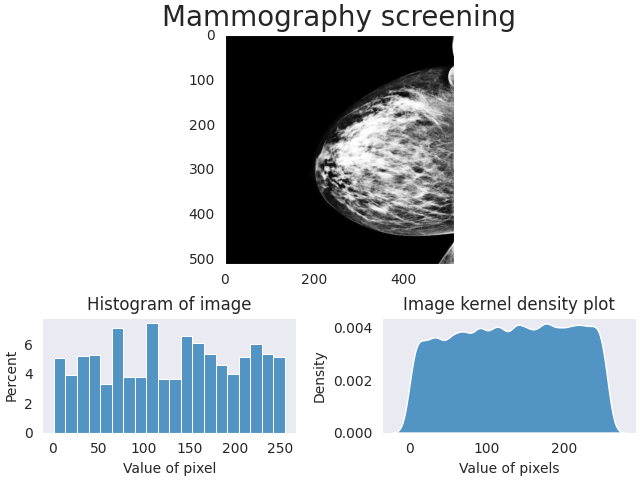

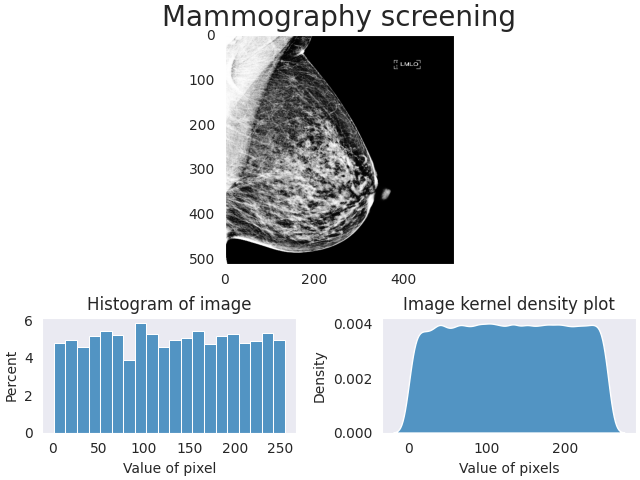

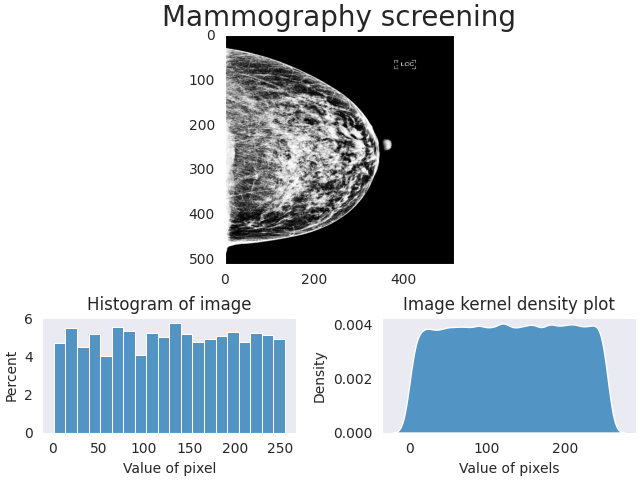

In [8]:
for img in imgs_equzd_sample:
    sns.set_style("dark")
    fig5 = plt.figure(constrained_layout=True)
    widths = [20, 20]
    heights = [20, 10]
    spec5 = fig5.add_gridspec(ncols=2, nrows=2, width_ratios=widths,
                              height_ratios=heights)

    ax = fig5.add_subplot(spec5[0, :])
    ax.set_title("Mammography screening")
    ax.title.set_size(20)
    plt.imshow(img, cmap="gray")


    ax = fig5.add_subplot(spec5[1, 0])
    sns.histplot(img[np.where(img!=0)].flatten(), bins=20, stat = "percent")
    ax.set_xlabel("Value of pixel")
    ax.set_title("Histogram of image")

    ax = fig5.add_subplot(spec5[1, 1])
    sns.kdeplot(data=img[np.where(img!=0)].flatten(), multiple="stack")
    ax.set_title("Image kernel density plot")
    ax.set_xlabel("Value of pixels")
    plt.show()


__After having equalized histograms, we could see that range and contrast in images seem to be more similar between images, it could be intersting to see if it enhances results in models__

## 3D histograms

__This part is too have a deeper view on how different are histograms of images, by using plotting histograms in a 3D space and by interpolating to have a surface, since the placement of images' histograms are arbitrary on the 3D space, one could use an optimization approach so that histograms that are similar are closer on the 3D space (detailed later)__ 

The following cell is not mandatory to run, it computes the distance between histograms of images (with MSE) and then uses a TSP model to smoothen the surface (reduce/avoid high variation between 2 histograms for 2 screenings), be careful, don't use it if there are too many screenings (high complextity for the algorithm)
You can find more details there: https://mlrose.readthedocs.io/en/stable/source/tutorial2.html

In [9]:
nbins = 100
# Creation of histograms of images to see the distance between images repartition of pixels (with MSE) 
L = np.array([np.histogram(img.flatten(),bins=nbins)[0] for img in imgs])
Dist = np.array([[math.sqrt(np.square(np.subtract(elem1,elem2)).mean()) for elem1 in L] for elem2 in L])

# Optimization model doesn't accept 0 on diagonal terms
for i in range(Dist.shape[0]):
    Dist[i][i]=10e8

# Reorganization of format of distances so that it could be trained
Dist_mlrose = [(i,j,Dist[i,j])for i in range(Dist.shape[0]) for j in range(Dist.shape[1])]

fitness_dists = mlrose.TravellingSales(distances = Dist_mlrose)
problem_fit = mlrose.TSPOpt(length = 30, fitness_fn = fitness_dists,
                            maximize=False)

# Get the best ordering (here genetic algorithm)
best_state, best_fitness = mlrose.genetic_alg(problem_fit, mutation_prob = 0.2, max_attempts = 30,random_state = 2)

In [10]:
# Create grids of histograms' points for 3D plot
nbins = 100
histograms = np.array([np.histogram(img[np.where(img>30)].flatten(),bins=nbins)[0] for img in imgs])
coordinates = np.array([np.histogram(img[np.where(img>3)].flatten(),bins=nbins)[1] for img in imgs])
# Rerange coordinates of histograms to be in the midle of the bar
coordinates2 = np.array([[(coordinates[i,j]+coordinates[i,j+1])/2 for j in range(coordinates.shape[1]-1)] for j in range(coordinates.shape[0])])

# To comment if not surface smoothing is done
histograms = histograms[best_state]
coordinates = coordinates[best_state]

# Space the histograms in the 3D space
width = 1
coordinateY = np.array([[width*n for i in range(coordinates2.shape[1])] for n in range(coordinates.shape[0])])


It could be that plotly doesn't render in offline notebooks in Jupyter Lab, you will need to install the extension for plotly in Jupyter lab with the next cell, cf. https://stackoverflow.com/questions/52771328/plotly-chart-not-showing-in-jupyter-notebook

In [11]:
#!jupyter labextension install jupyterlab-plotly

In [12]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()


# Dimension of coordinates of histograms
x = coordinates2.flatten()
# Dimension of the images (each unit*width is a histogram from one image)
y = coordinateY.flatten()
# Number of pixels in the histogram
z = histograms.flatten()

# Meshgrid for the 3D surface
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
X,Y = np.meshgrid(xi,yi)

# Gridata with interpolation
Z = griddata((x,y),z,(X,Y), method='cubic')


# Plot the 3D surface
pio.renderers.default = 'iframe'
fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene = dict(
                    xaxis_title='Coordinates in the histograms',
                    yaxis_title='Sequence of images/histograms',
                    zaxis_title='Number of pixels'),
                  font = dict(color = "black",size  =10), 
                  )
fig.update_layout(title = dict(text="3D representation of histograms of n images", 
                               font=dict(color = "black",size  =20),xanchor=  'center',
        yanchor= 'top',y=0.9,
        x=0.5))

fig.show()

# Some basics analysis on images

__This part's aim is to have a closer look to the images and to see if pre-processing is needed__

https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2

In [13]:
# Import train data
img_path = "../kaggle_dataset"
train_df = pd.read_csv("data/train.csv")
print(train_df.head(5))

In [16]:
# Display all views possible (Note that there are only some labels (AT, LM, ML, LMO) are surely equal to MLO or CC)
train_df["view"].value_counts()

MLO    27903
CC     26765
AT        19
LM        10
ML         8
LMO        1
Name: view, dtype: int64

In [17]:
# View laterality
train_df["laterality"].value_counts()

R    27439
L    27267
Name: laterality, dtype: int64

In [18]:
# Create the path of the image in the dataframe
train_df["path"] = train_df.apply(lambda x: "".join([img_path,"/",str(x["patient_id"]),"_",str(x["image_id"]),".png"]), axis=1)

In [19]:
# Create dataframe for each triplet of laterality, view, and having the cancer or not
L_MLO_C = train_df[(train_df["laterality"]=="L") & (train_df["view"]=="MLO")&(train_df["cancer"]==1)]
R_MLO_C = train_df[(train_df["laterality"]=="R") & (train_df["view"]=="MLO")&(train_df["cancer"]==1)]
L_CC_C = train_df[(train_df["laterality"]=="L") & (train_df["view"]=="CC")&(train_df["cancer"]==1)]
R_CC_C = train_df[(train_df["laterality"]=="R") & (train_df["view"]=="CC")&(train_df["cancer"]==1)]

L_MLO_NC = train_df[(train_df["laterality"]=="L") & (train_df["view"]=="MLO")&(train_df["cancer"]==0)]
R_MLO_NC = train_df[(train_df["laterality"]=="R") & (train_df["view"]=="MLO")&(train_df["cancer"]==0)]
L_CC_NC = train_df[(train_df["laterality"]=="L") & (train_df["view"]=="CC")&(train_df["cancer"]==0)]
R_CC_NC = train_df[(train_df["laterality"]=="R") & (train_df["view"]=="CC")&(train_df["cancer"]==0)]

# Add the real name of view 
LView = [L_MLO_C,R_MLO_C,L_CC_C,R_CC_C,L_MLO_NC,R_MLO_NC,L_CC_NC,R_CC_NC]
LName = ["Left Mediolateral Oblique with cancer", "Right Mediolateral Oblique with cancer", "Left Cranial Caudal with cancer","Right Cranial Caudal with cancer","Left Mediolateral Oblique without cancer", "Right Mediolateral Oblique without cancer", "Left Cranial Caudal without cancer","Right Cranial Caudal without cancer" ]
NbC = sum([len(elem) for elem in LView[:4]])
NbNC = sum([len(elem) for elem in LView[4:]])
N = [NbC,NbNC]
NText = ["with cancer", "without Cancer"]
compt =0
# Print the repartition of examples repartition between view,laterality and having cancer or not
for ind,(view, name) in enumerate(zip(LView, LName)):
    compt+=1
    print(f" There are {len(view)} images of: {name} ; That represents of {'{:.1%}'.format(len(view)/N[ind//4])} of people {NText[ind//4]} and {'{:.2%}'.format(len(view)/len(train_df))} of all images")
    if compt==4:
        print()


 There are 302 images of: Left Mediolateral Oblique with cancer ; That represents of 26.1% of people with cancer and 0.55% of all images
 There are 288 images of: Right Mediolateral Oblique with cancer ; That represents of 24.9% of people with cancer and 0.53% of all images
 There are 286 images of: Left Cranial Caudal with cancer ; That represents of 24.7% of people with cancer and 0.52% of all images
 There are 280 images of: Right Cranial Caudal with cancer ; That represents of 24.2% of people with cancer and 0.51% of all images

 There are 13656 images of: Left Mediolateral Oblique without cancer ; That represents of 25.5% of people without Cancer and 24.96% of all images
 There are 13657 images of: Right Mediolateral Oblique without cancer ; That represents of 25.5% of people without Cancer and 24.96% of all images
 There are 13009 images of: Left Cranial Caudal without cancer ; That represents of 24.3% of people without Cancer and 23.78% of all images
 There are 13190 images of: 

In each mammogram examination, a breast is typically imaged with two different views, i.e., the mediolateral oblique (MLO) view and cranial caudal (CC) view; cf. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6113143/

__From the statistics above, one could see that each view and laterality is represented quite equally, the main gap being with and without cancer, since cancer is an anomaly__

In [20]:
# Creat samples dataset for average images
n_samples = 100

L_MLO_C_Sample = L_MLO_C.sample(n=n_samples)
R_MLO_C_Sample = R_MLO_C.sample(n=n_samples)
L_CC_C_Sample = L_CC_C.sample(n=n_samples)
R_CC_C_Sample = R_CC_C.sample(n=n_samples)

L_MLO_NC_Sample = L_MLO_NC.sample(n=n_samples)
R_MLO_NC_Sample = R_MLO_NC.sample(n=n_samples)
L_CC_NC_Sample = L_CC_NC.sample(n=n_samples)
R_CC_NC_Sample = R_CC_NC.sample(n=n_samples)
Sample_list = [L_MLO_C_Sample,R_MLO_C_Sample,L_CC_C_Sample,R_CC_C_Sample,L_MLO_NC_Sample,R_MLO_NC_Sample,L_CC_NC_Sample,R_CC_NC_Sample]

In [22]:
# Create the average image for each view
mean_images=[]
for sample_elem in Sample_list:
    list_for_mean = []
    for file in sample_elem["path"]:
        img = cv2.imread(file)
        img = cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
        list_for_mean.append(img)
    list_for_mean = np.array(list_for_mean)
    mean_img = np.mean(list_for_mean, axis = 0)/255
    mean_images.append(mean_img)
mean_images=np.array(mean_images)
LName = ["Left Mediolateral Oblique with cancer", "Right Mediolateral Oblique with cancer", 
         "Left Cranial Caudal with cancer","Right Cranial Caudal with cancer","Left Mediolateral Oblique without cancer", 
         "Right Mediolateral Oblique without cancer", "Left Cranial Caudal without cancer","Right Cranial Caudal without cancer" ]

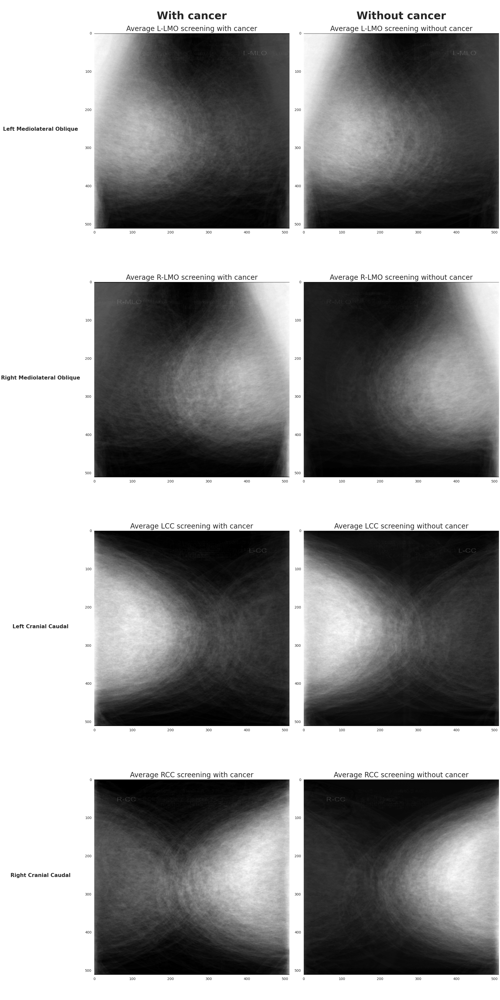

In [25]:
sns.set_style("dark")
fig5 = plt.figure(constrained_layout=True,figsize=(20, 40))
widths = [10, 10]
heights = [40,40,40,40]
spec5 = fig5.add_gridspec(ncols=2, nrows=4,width_ratios=widths,
                              height_ratios=heights)

ax = fig5.add_subplot(spec5[0, 0])
ax.set_title("Average L-LMO screening with cancer")
ax.title.set_size(20)
plt.imshow(mean_images[0], cmap="gray")
ax.annotate("With cancer", xy=(0.5, 1), xytext=(0, 40),
                xycoords='axes fraction', textcoords='offset points',
                 ha='center', va='baseline', fontsize=30, weight='bold')
ax.annotate("Left Mediolateral Oblique", xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 120, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 ha='center', va='baseline', fontsize=15, weight='bold')



ax = fig5.add_subplot(spec5[0, 1])
ax.set_title("Average L-LMO screening without cancer")
ax.title.set_size(20)
plt.imshow(mean_images[4], cmap="gray")
ax.annotate("Without cancer", xy=(0.5, 1), xytext=(0, 40),
                xycoords='axes fraction', textcoords='offset points',
                 ha='center', va='baseline', fontsize=30, weight='bold')


## Line 2
ax = fig5.add_subplot(spec5[1, 0])
ax.set_title("Average R-LMO screening with cancer")
ax.title.set_size(20)
plt.imshow(mean_images[1], cmap="gray")
ax.annotate("Right Mediolateral Oblique", xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 120, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 ha='center', va='baseline', fontsize=15, weight='bold')

ax = fig5.add_subplot(spec5[1, 1])
ax.set_title("Average R-LMO screening without cancer")
ax.title.set_size(20)
plt.imshow(mean_images[5], cmap="gray")

## Line 3
ax = fig5.add_subplot(spec5[2, 0])
ax.set_title("Average LCC screening with cancer")
ax.title.set_size(20)
plt.imshow(mean_images[2], cmap="gray")
ax.annotate("Left Cranial Caudal", xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 120, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 ha='center', va='baseline', fontsize=15, weight='bold')

ax = fig5.add_subplot(spec5[2, 1])
ax.set_title("Average LCC screening without cancer")
ax.title.set_size(20)
plt.imshow(mean_images[6], cmap="gray")

## Line 4
ax = fig5.add_subplot(spec5[3, 0])
ax.set_title("Average RCC screening with cancer")
ax.title.set_size(20)
plt.imshow(mean_images[3], cmap="gray")
ax.annotate("Right Cranial Caudal", xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 120, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 ha='center', va='baseline', fontsize=15, weight='bold')

ax = fig5.add_subplot(spec5[3, 1])
ax.set_title("Average RCC screening without cancer")
ax.title.set_size(20)
plt.imshow(mean_images[7], cmap="gray")


plt.show()

__From these average images, average shapes for the same view with or without cancer could differ a bit but it could be  that we don't have representative sample from the population. We can also see from average images that some screenings seem to have wrong laterity labels compared to the actual images, one could also try to see if view are correctly annotated. Finally, we can clearly see the position of labels of orientation in the mamography screenings.__ 

TODO

* Small Analysis of Eigenvalues (PCA), variance
* Try to detect outliers
* See needed preprocessing
* Data augmentation?

In [ ]:
#!pip3 install ipywidgets

In [ ]:
#!jupyter labextension install jupyterlab-plotly